## Veri İçeriği
Hasta durumu tahmin etme? -iyi huy kötü huy tahmin etme?
#### Attribute Information(Öznitelik Bilgileri)
- ID number
- Diagnosis (M = malignant(kötü huylu), B = benign)
#### Ten real-valued features are computed for each cell nucleus
Her hücre için 10 gerçek değerli özellik hesaplanır.

- radius (mean of distances from center to points on the perimeter)
Yarıçap (hücre çeperinden çekirdeğe ortalama uzaklık)

- texture (standard deviation of gray-scale values)
Doku (gri-ölçek değerlerin standart sapması)

- perimeter(çevre)
Hücrelerin çevre uzunlukları ortalaması, standart sapması ve
en kötü değeri

- area(alan)
Hücrelerin yüzey alanları ortalaması, standart sapması ve en kötü
değeri

- smoothness (local variation in radius lengths)
Düzgünlük (hücre çekirdeğine olan uzunluktaki farklılık)

- compactness (perimeter^2 / area - 1.0)
Sıklık Çevre²/(Alan-1)

- concavity (severity of concave portions of the contour)
Dışbükeylik


- concave points (number of concave portions of the contour)
Dışbükey noktalar (dışbükey alanların hücre çeperine oranı)

- symmetry
Simetri

- fractal dimension ("coastline approximation" - 1)
Fraktal boyutu
İç içe geçmiş düzensiz hücrelerin tüm normal
hücrelere oranının ortalaması, standart sapması ve en kötü değeridir.

Yukarıda verilen her 10 kategori için, (1) ortalama, (2) en yüksek değer, (3) standart hatası verilmiştir. Böylece hasta başına 3 * 10 + 1 = 31 verinoktası bulunmaktadır.


In [19]:
#Kütüphanelerin  yüklenmesi
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# data modeling
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [20]:
data=pd.read_csv('breast-cancer.csv')

##### - Pandas kütüpahnesi ile veri setimizi yükledik.

#### 1-Veri setinin inclenmesi

- Veri setindeki tüm satırlar

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave_points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

- Veri setinin boyutu

In [22]:
data.shape

(569, 32)

- 569 satır ve 33 sütundan oluşan bir veri setine sahibiz.

- İlk 20 verinin değerlerine genel bakış

In [23]:
data.head(20)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.26540,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.18600,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.24300,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.25750,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.16250,0.2364,0.07678
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.17410,0.3985,0.12440
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.19320,0.3063,0.08368
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.15560,0.3196,0.11510
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.20600,0.4378,0.10720
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.22100,0.4366,0.20750


- Yukarıdaki veri değerlerine bakılınca:
  - Sınıflandırma için kullanılamayan bir id var.
  - Diagnosis class labeldır.
  - Unnamed:32 özellik nan'ı içerir.( bu yüzden buna ihtiyacımız yok)sonuçlarına ulaşılır.

- Veri setinin istatiksel özeti

In [24]:
data.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [25]:
#özelliklerin veri tipleri
data.dtypes

id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave_points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave_points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

- Veride genel olarak float tipinde değişkenler var.32 sayısal değişken ve 1 kategorik değişken olduğunu görebiliriz.Aynı şeyi doğrulamak için değişkenlerdeki değerlerin frekans dağılımını kontrol edeceğim.

#### Değişkenlerdeki değerlerin frekans dağılımı

In [26]:
for var in data.columns:
    
    print(data[var].value_counts())

id
842302     1
90250      1
901315     1
9013579    1
9013594    1
          ..
873885     1
873843     1
873701     1
873593     1
92751      1
Name: count, Length: 569, dtype: int64
diagnosis
B    357
M    212
Name: count, dtype: int64
radius_mean
12.34    4
11.71    3
12.46    3
13.05    3
10.26    3
        ..
12.23    1
14.45    1
19.18    1
18.08    1
7.76     1
Name: count, Length: 456, dtype: int64
texture_mean
20.52    3
16.85    3
16.84    3
19.83    3
14.93    3
        ..
18.58    1
15.11    1
22.41    1
14.92    1
24.54    1
Name: count, Length: 479, dtype: int64
perimeter_mean
82.61     3
87.76     3
134.70    3
93.97     2
82.69     2
         ..
127.50    1
90.63     1
82.53     1
100.40    1
47.92     1
Name: count, Length: 522, dtype: int64
area_mean
512.2     3
1075.0    2
582.7     2
399.8     2
641.2     2
         ..
507.4     1
609.9     1
463.7     1
428.9     1
181.0     1
Name: count, Length: 539, dtype: int64
smoothness_mean
0.10070    5
0.11500    4
0.10540

Veri türünün inteeger türünde olduğunu gösteriyor.

In [27]:
# Özellik adlarını liste olarak alma
data.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave_points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [28]:
#her sütunundaki eksik değerleri kontrol etme
data.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave_points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave_points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave_points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

- Verilerimiz de her sütunda kaç adet eksik (NaN) değer olduğunu gösteriyor. Çıktıdaki her sütun adı, sütundaki eksik değer sayısını ve toplam veri noktası sayısını belirtir. Örneğin, “Unnamed: 32” sütununda 569 eksik değer bulunmaktadır. Diğer sütunlarda ise eksik değer yok gibi görünüyor, çünkü bu sütunların eksik değer sayısı sıfır olarak listeleniyor. # Unnamed: 32’ sütununu veri çerçevesinden çıkarır:

In [29]:
#satırın bir önceki satırın kopyası olması durumunda true tersi durumda false döndürür.
data.duplicated().sum()

0

In [ ]:
#Eksik veri içeren kolonu silme
data.drop(columns=['Unnamed:32'],inplace = True)
#Daha önceden çalıştığı için silindi sonrasında hata veriyor

In [31]:
#Silinen veriyi kontrol etmek için  veri setinin boyutunu kontrol ettim.
data.shape

(569, 32)

In [32]:
B,M=data["diagnosis"].value_counts()
print('Number of Benign: ',B)
print('Number of Malignant : ',M)

Number of Benign:  357
Number of Malignant :  212


- "diagnosis" sütunundaki farklı değerlerin sayısını value_counts() fonksiyonuyla elde ediyoruz. Bu fonksiyon, her bir farklı değerin kaç kez tekrarlandığını gösteren bir seri döndürüyor.

<Axes: xlabel='count', ylabel='diagnosis'>

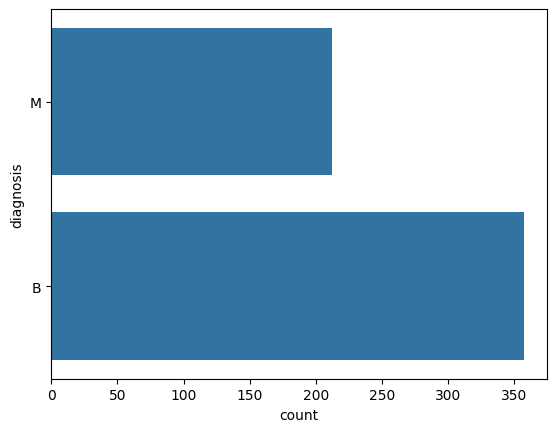

In [33]:
#"diagnosis" sütunundaki değerlerin sayısını görselleştirmek.
#import seaborn as sns
sns.countplot(data["diagnosis"],label="count")


212 kötü huylu tümör 
357 iyi huylu tümör görselini gösteren plot grafiği
Veri setinin düzgün bir şekilde dengelenmediği ve iyi huylu tümörlerin sayısının kötü huylu tümörlerin neredeyse iki katı olduğu gözlemlenebilir

- Kategorik sayıyı sayısala dönüştürme

In [34]:
#from sklearn.preprocessing import LabelEncoder
labelencoder_Y=LabelEncoder()
# 'diagnosis' sütununu sayısal formata dönüştür
labelencoder_Y = LabelEncoder()
data.iloc[:, 1] = labelencoder_Y.fit_transform(data.iloc[:, 1].values)


- DataFrame'i güncelle (eğer değişikliği kalıcı hale getirmek istiyorsanız)
- data = data ile değişiklik yapılabilir veya inplace=True parametresi kullanılabilir.

#### 2-Visualization

- Şimdi, verilerimiz hakkında temel bir anlayışa sahibiz. Verilerimizi daha iyi anlamak için bazı veri görselleştirmeleriyle tamamlayacağım.


- Tek değişkenli grafikler
  Değişkenlerin dağılımını kontrol edelim.Normal mi yoksa çarpık mı olduklarını bulmak için değişken dağılımları kontrol etmek için histogramları çizeceğim.

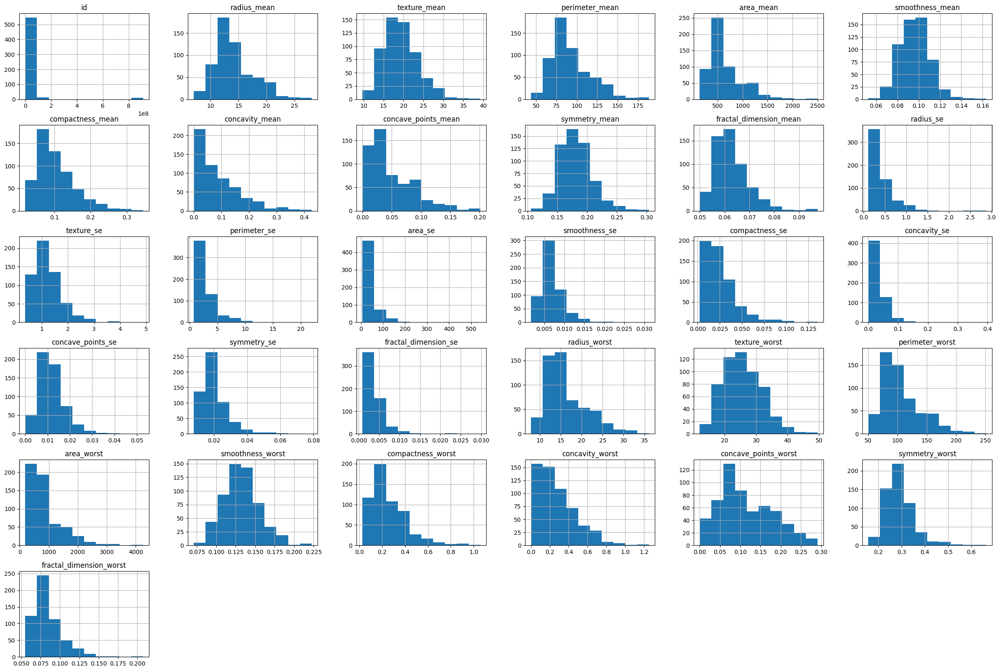

In [35]:
data.hist(figsize=(30,20))
plt.show()
#histogram ile  özelliklerin dağılımı

- Veri kümesindeki tüm değişkenlerin pozitif olarak çarpık olduğunu görebiliriz.

- Bir sonraki adımda tüm özellikler arasındaki korelasyonu gösteren bir ısı haritası oluşturalım.

<Axes: >

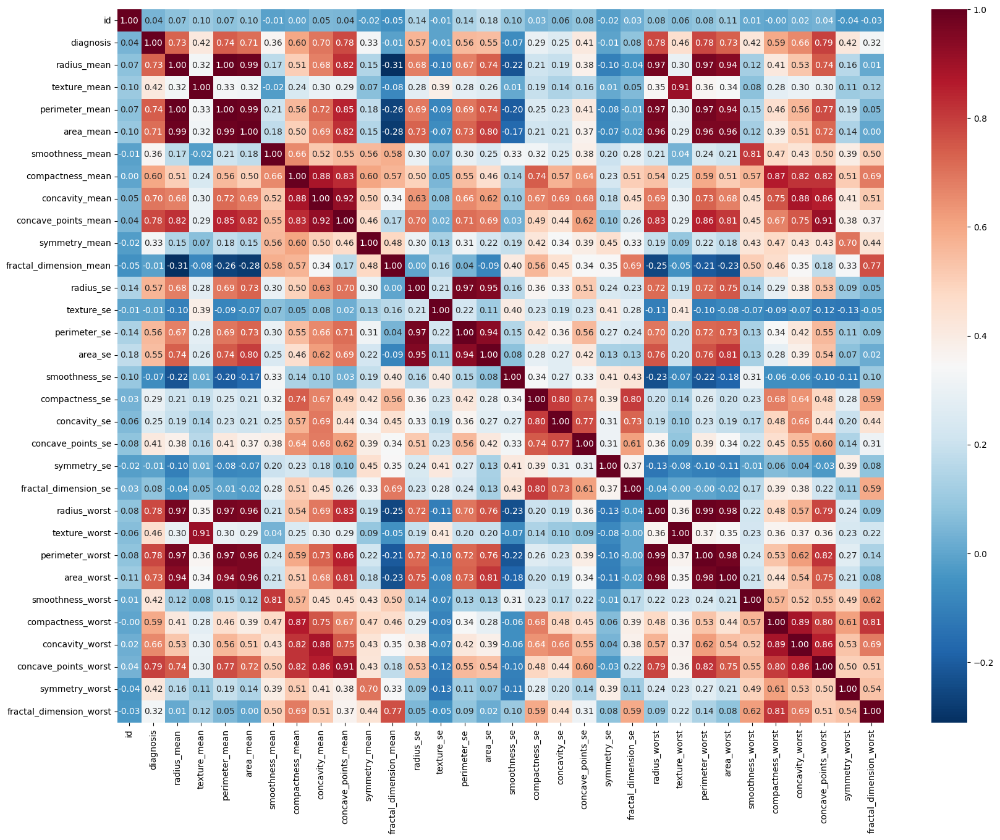

In [36]:
plt.figure(figsize=(20,15))
sns.heatmap(data.corr(),annot=True,cmap="RdBu_r",fmt=".2f")

- Isı haritası her özellik arasındaki korelasyonu tek tek gösterir. Tüm özellikler içindeki ilişkiyi belirtmek için 900 (30 özellik x 30 özellik) ilişki içerir. Daha koyu mavi renkler, bu özellikler arasında açık ve pozitif bir korelasyon olduğunu temsil ederken, daha açık mavi renkler, benign meme kitlesi için negatif bir korelasyon ve korelasyonsuz olduğunu gösterir. Benzer şekilde, daha koyu kırmızı renkler bu özellikler arasında açık ve pozitif bir ilişki olduğunu temsil ederken, daha açık kırmızı renkler malign meme kitlesi için negatif bir korelasyon ve korelasyonsuz olduğunu göstermektedir. Örneğin yarıçap ortalaması ve çevre ortalamaları 1,0 katsayı değeriyle güçlü ve pozitif bir korelasyona sahiptir.

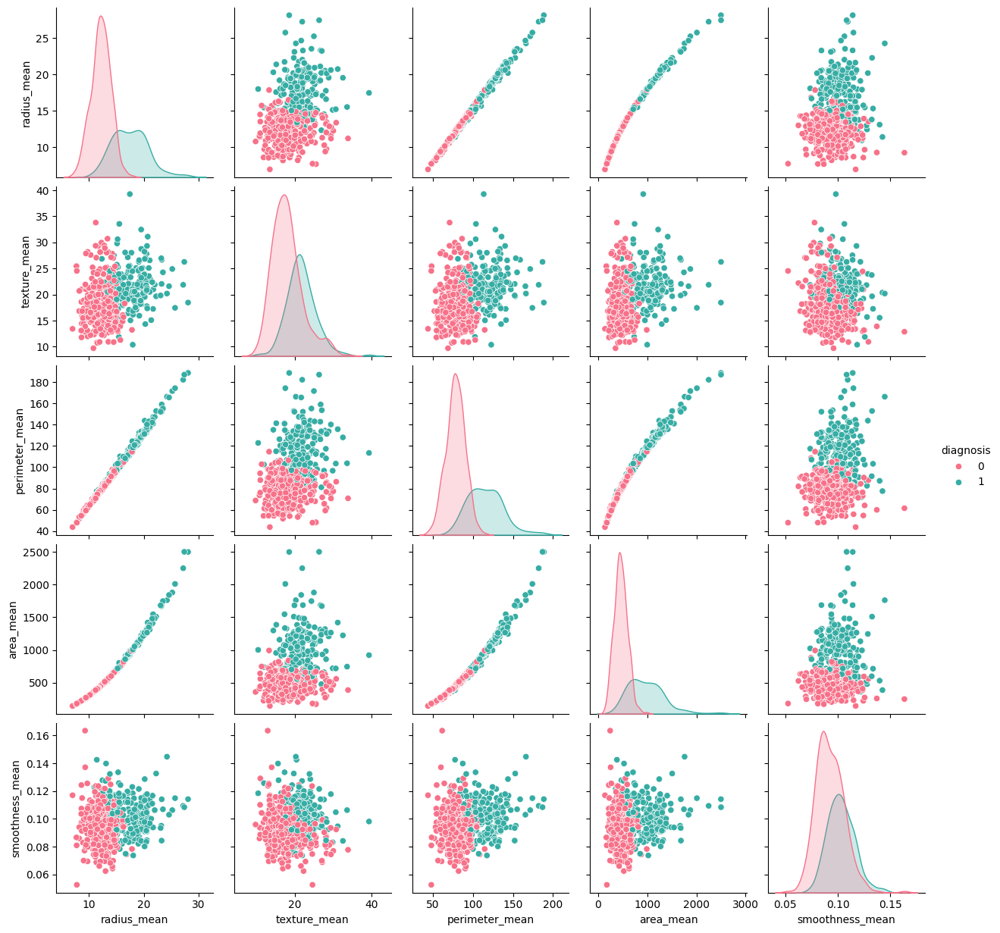

In [37]:
sns.pairplot(data,hue="diagnosis",palette="husl",
             vars = ['radius_mean', 'texture_mean', 'perimeter_mean',
                       'area_mean', 'smoothness_mean']
            )
#Hue, çizim yönlerini farklı renklerle eşlemek için verilerdeki değişkenlerdeki farkı elde etmenize yardımcı olur.


- Yukarıdaki görselleştirmeden, kötü huylu vakalar için (örn. hedef=0) mean radius, mean perimeter, mean texture, and mean smoothness gibi tüm özelliklerin iyi huylu vakalardan daha yüksek olduğunu gözlemleyebiliriz.

- area_mean-radius_mean ve area_mean-perimeter_mean pozitif korelasyonlu dağılım grafikleridir.
- texture_mean- smoothness_mean özellikleri arasındaki korelasyon zayıf ve düzensizdir.Bu, özellikler arasında hiçbir korelasyon olmadığı ve birbirini etkilemediği anlamına gelir.

area_mean-someoothness_mean  garfiğine baktığımızda daha düşük someoothness_mean ve daha yüksek area_mean ile kötü huylu vakalrın iyi huylu vakalardan daha yüksek olduğunu gözlemleyebiliriz.

Korelasyona bakılacak veriler
radius_mean vs concavity_mean-
radius_mean vs concave points_mean
radius_mean vs perimeter_worst-
radius_mean vs area_worst
area_mean vs symmetry_mean-
area_mean vs smoothness_mean-
fractal_dimension_mean vs radius_mean-
fractal_dimension_mean vs area_mean-
area_mean vs smoothness_se
perimeter_mean vs smoothness_se

diagnois:
0:Kötü huylu
1:İyi huylu

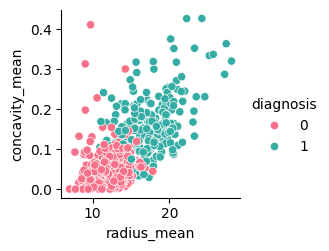

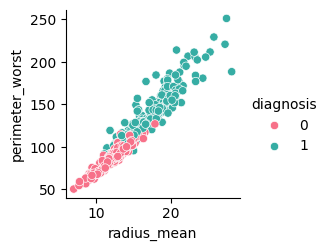

In [38]:
sns.pairplot(data,hue="diagnosis",palette="husl",x_vars=['radius_mean'], y_vars=['concavity_mean'])

sns.pairplot(data,hue="diagnosis",palette="husl",x_vars=['radius_mean'], y_vars=['perimeter_worst'])
plt.show()

- (concavity_mean vs radius_mean )Pozitif korelasyon -> iki değişken arasındaki en düşük ilişkiyi gösterir.
Özellikler arasındaki korelasyon açık, doğru ve yüksektir

- (radius_mean vs perimeter_worst) Değişkenler arasındaki en yüksek korelasyon

area_mean vs symmetry_mean
area_mean vs smoothness_mean

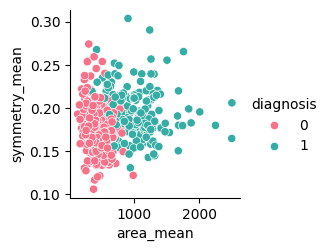

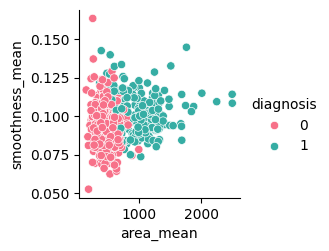

In [39]:
sns.pairplot(data,hue="diagnosis",palette="husl",x_vars=['area_mean'], y_vars=['symmetry_mean'])
sns.pairplot(data,hue="diagnosis",palette="husl",x_vars=['area_mean'], y_vars=['smoothness_mean'])
plt.show()

 - (area_mean vs symmerty_mean)özellikler arasındaki korelasyon zayıf, negatif ve yüksektir. 
 -  (area_mean vs smoothness_mean)yarıçap ortalaması ve fraktal boyut ortalaması (Radius mean and fractal dimension )en zayıf olanıdır.
 Her ikiside negatif korelasyon grafiğidir.

fractal_dimension_mean vs radius_mean
fractal_dimension_mean vs area_mean

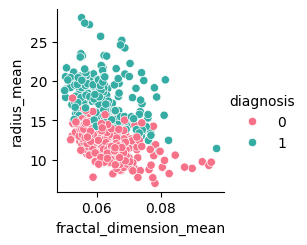

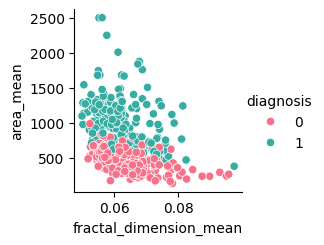

In [40]:

# İlk pairplot çizimi
grid = sns.PairGrid(data, hue="diagnosis", palette="husl", x_vars=['fractal_dimension_mean'], y_vars=['radius_mean'])
grid.map_diag(sns.histplot)
grid.map_offdiag(sns.scatterplot)
grid.add_legend()

# İkinci pairplot çizimi
grid = sns.PairGrid(data, hue="diagnosis", palette="husl", x_vars=['fractal_dimension_mean'], y_vars=['area_mean'])
grid.map_diag(sns.histplot)
grid.map_offdiag(sns.scatterplot)
grid.add_legend()

#Grafiği göster
plt.show()


- Negatif korelasyonlu dağılım 
  - fractal_dimension_mean vs area_mean en yüksek korelasyon yoğunluğuna sahiptir.
  

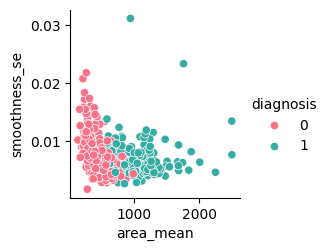

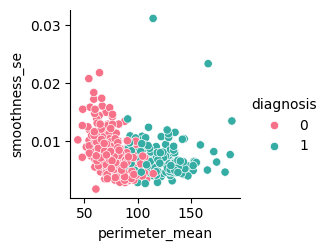

In [41]:
sns.pairplot(data,hue="diagnosis",palette="husl",x_vars=['area_mean'], y_vars=['smoothness_se'])
sns.pairplot(data,hue="diagnosis",palette="husl",x_vars=['perimeter_mean'], y_vars=['smoothness_se'])
plt.show()


- Her ikiside negatif korelasyonlu dağılım grafiğidir
- Özellikler arasındaki korelasyon zayıf, negatif ve yüksektir.

- Görselleştirilen  grafiklerden :
  - Pozitif korelasyonlu
    - radius_mean vs concavity_mean
    - radius_mean vs perimeter_worst
  - Negatif korelasyonlu
    - area_mean vs symmetry_mean
    - area_mean vs smoothness_mean
    - fractal_dimension_mean vs radius_mean
    - fractal_dimension_mean vs area_mean
    - area_mean vs smoothness_se
    - perimeter_mean vs smoothness_se

- Pozitif korelasyonlu kategori altında yarıçap ortalaması, içbükeylik ortalaması, içbükey noktaların ortalaması, çevre en kötü, en kötü alan ve en kötü kompaktlık özellikleri gruplandırılarak grafikleri çizildi. Negatif korelasyon kategorisi altında düzgünlük ortalaması, doku ortalaması, yarıçap ortalaması, fraktal boyut ortalaması, en kötü doku, simetri se, simetri ortalaması ve alan ortalaması da gruplandırılarak grafikleri sunuldu

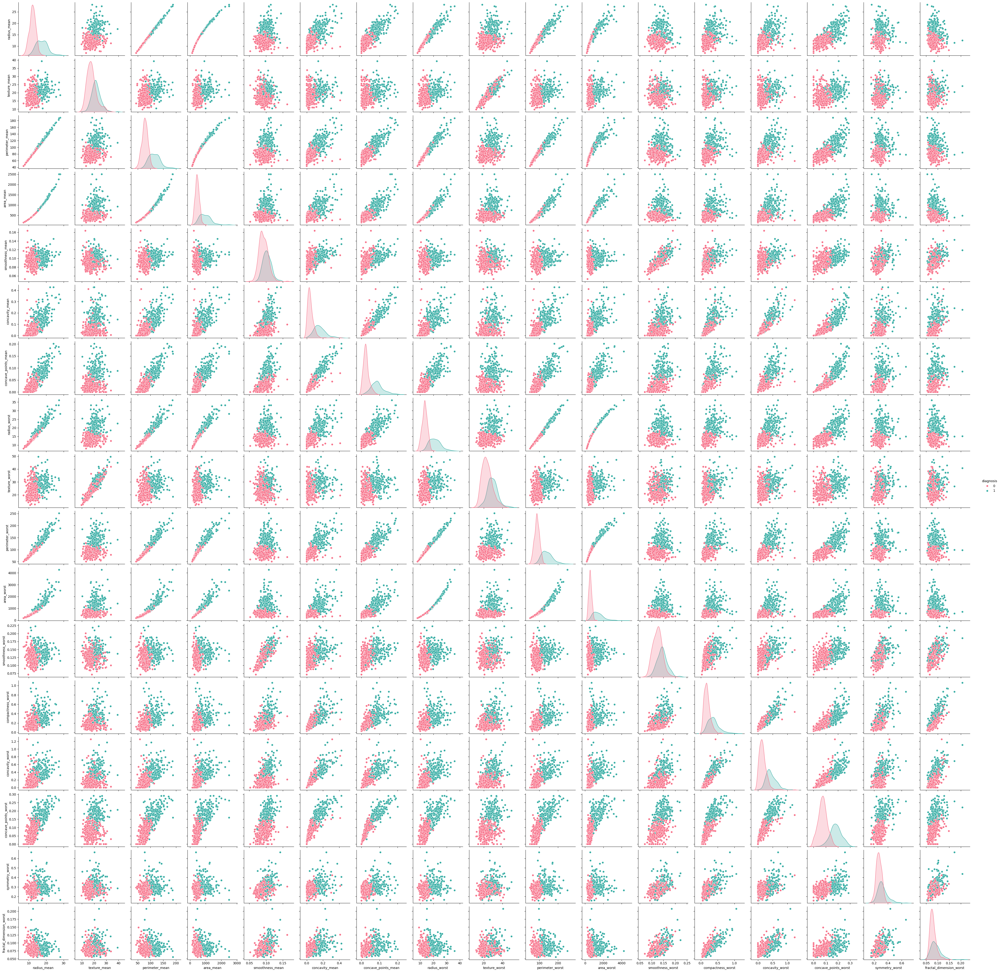

In [42]:
sns.pairplot(data,hue="diagnosis",palette="husl",
             vars = ['radius_mean', 'texture_mean', 'perimeter_mean',
                       'area_mean', 'smoothness_mean','concavity_mean',
                        'concave_points_mean', 'radius_worst','texture_worst',
                        'perimeter_worst','area_worst','smoothness_worst',
                        'compactness_worst','concavity_worst','concave_points_worst','symmetry_worst','fractal_dimension_worst']
            )

- Veri setimizde fazla veri olduğu için daha negatif korelasyonlar olduğunu görüyoruz.

In [43]:
#tanı sütunu ile verilerin korelasyonuna bakma
data.corrwith(data['diagnosis']).abs().sort_values(ascending=False)

diagnosis                  1.000000
concave_points_worst       0.793566
perimeter_worst            0.782914
concave_points_mean        0.776614
radius_worst               0.776454
perimeter_mean             0.742636
area_worst                 0.733825
radius_mean                0.730029
area_mean                  0.708984
concavity_mean             0.696360
concavity_worst            0.659610
compactness_mean           0.596534
compactness_worst          0.590998
radius_se                  0.567134
perimeter_se               0.556141
area_se                    0.548236
texture_worst              0.456903
smoothness_worst           0.421465
symmetry_worst             0.416294
texture_mean               0.415185
concave_points_se          0.408042
smoothness_mean            0.358560
symmetry_mean              0.330499
fractal_dimension_worst    0.323872
compactness_se             0.292999
concavity_se               0.253730
fractal_dimension_se       0.077972
smoothness_se              0

- Yukarıda çizilen grafiklerden ve verilerin korelasyonuna bakıldığında düşük olanları çıkartalım.

In [44]:
#korelasyonu düşük olan verileri çıkarma
cols = [
'fractal_dimension_se',
'smoothness_se',
'fractal_dimension_mean',
'texture_se',
'symmetry_se']

high_corr = data.drop(cols, axis=1)


- Korelasyonu düşük verileri çıkardık.

In [45]:
high_corr

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


- Ayrıca kimlik sütununa da ihtiyacımız yok, bu yüzden onu bırakacağız ve 222 sütunla kalacağız.

In [46]:
# dropping the id which was not needed 
high_corr.drop('id', axis=1)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


#### 3-Model Eğitimi

- Veri Bölme 
  -  x ve y veri kümeleri train ve test şeklinde ikiye bölünmeli. Biz verilerin train bölümünü eğitimde kullanacağız y verilerini ise elde ettiğimiz performansların doğruluk oranı için kullanacağız.

In [47]:
#Train-test ayrımı
x=high_corr.drop(["diagnosis"],axis=1)
y = high_corr["diagnosis"].values.reshape(-1,1)  #target
print('shape of x : {} \nshape of y : {}'.format(x.shape , y.shape))


shape of x : (569, 26) 
shape of y : (569, 1)


In [48]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.20, random_state=5)

- Veri Ölçeklendirme  
  - StandardScaler
  - Elimizdeki yüksek boyutlu veri olduğundan,veriyi ölçeklendirmek,daha sonra ele alacağımız analizler için yardımcı olacaktır.

In [49]:
#from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

- K-Nearest Neighbour(KNN) model oluşturma

- y_train sayısal bir formattadır.Kategorik olması için  LabelEncoder veya OneHotEncoder gibi bir dönüşüm kullanarak etiketleri uygun bir formata çevirelim.Daha sonra k=1'den k=10'a kadar olan K-Nearest Neighbors (KNN) fonksiyonunu  oluşturalım.Her k değeri için bir KNN modeli eğitilir ve doğruluk skorları yazdırılır.

In [50]:
labelencoder_Y = LabelEncoder()
y_train = labelencoder_Y.fit_transform(y_train)
y_test= labelencoder_Y.fit_transform(y_test)

/Users/iremcakcak/miniconda3/envs/myenv/lib/python3.12/site-packages/sklearn/preprocessing/_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/iremcakcak/miniconda3/envs/myenv/lib/python3.12/site-packages/sklearn/preprocessing/_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [51]:

#k=1 den K=10 a kadar k değerleri için  doğruluk skoru hesaplama için fonksiyon
def knn_classifier(X_train, y_train, X_test, y_test, k_values):
    accuracies = []

    for k in k_values:
        # KNeighborsClassifier kullanarak modeli eğit
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(X_train, y_train)

        # Modeli kullanarak tahmin yap
        y_pred = knn.predict(X_test)

        # Doğruluk skorunu hesapla
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)
        print(f'Model accuracy score (k={k}): {accuracy:0.4f}')
        print("Classification Report:")

        print(classification_report(y_test, y_pred))

        print("Confusion Matrix:")

        print(confusion_matrix(y_test, y_pred))

 
    return accuracies

# k=1'den k=10'a kadar olan KNN modellerini eğit ve değerlendir
k_values = range(1, 11)
accuracies=knn_classifier(X_train, y_train, X_test, y_test, k_values)


Model accuracy score (k=1): 0.9561
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.98      0.96        66
           1       0.98      0.92      0.95        48

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114

Confusion Matrix:
[[65  1]
 [ 4 44]]
Model accuracy score (k=2): 0.9649
Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        66
           1       1.00      0.92      0.96        48

    accuracy                           0.96       114
   macro avg       0.97      0.96      0.96       114
weighted avg       0.97      0.96      0.96       114

Confusion Matrix:
[[66  0]
 [ 4 44]]
Model accuracy score (k=3): 0.9649
Classification Report:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97

- Test Seti görselleştirme

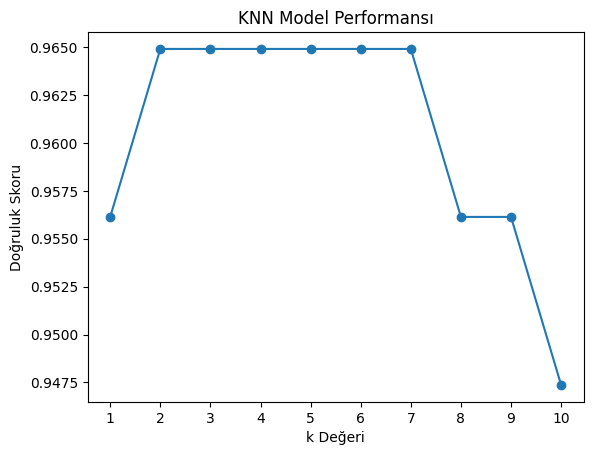

In [52]:
# Grafiği oluştur
plt.plot(k_values, accuracies, marker='o')
plt.title('KNN Model Performansı')
plt.xlabel('k Değeri')
plt.ylabel('Doğruluk Skoru')
plt.xticks(k_values)
plt.show()

-k=2,,3,4,5,6,7 ile0,9650 doğruluk puanı elde ederiz.Böylece performans artışı ile sonuçlanır.k değerini çok arttırırsak doğruluk azaldığı sonucuna ulaşabiliriz.

Şimdi, yukarıdaki analize dayanarak, sınıflandırma modelimizin doğruluğunun kısmen  iyi olduğu sonucuna varabiliriz. Modelimiz sınıf etiketlerini tahmin etmek açısından kısmen iyi bir iş çıkarıyor.Ancak, temel değer dağılımını vermez. Ayrıca, sınıflandırıcımızın yaptığı hataların türü hakkında hiçbir şey söylemez.Modelimizi logistic regression ile eğitip ikisi arasında karşılaştırma yapalım.

- SVM Model Oluşturma

In [53]:
svc=SVC()
svc.fit(X_train,y_train)

SVC()

In [58]:
# değerleri tahmin et
y_pred_svc =svc.predict(X_test)
y_pred_svc.shape

(114,)

Confusion matrix:
 [[64  2]
 [ 2 46]]


<Axes: >

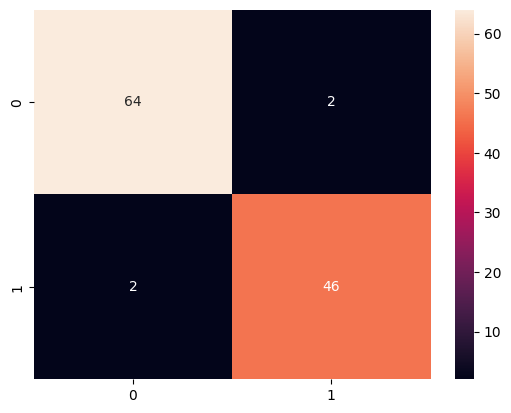

In [67]:
y_predict = svc.predict(X_test)
cm = confusion_matrix(y_test, y_predict)
print("Confusion matrix:\n",cm)
sns.heatmap(cm, annot=True)

Tahminler, test verilerinin meme kanseri sınıflandırma sonucudur. Ölçeklendirilmiş test veri girişini geçiyoruz ve modele göre tahminleri alıyoruz. Daha sonra, karışıklık matrisini elde etmek için tahmini, hedef test çıktısıyla birlikte karışıklık matrisine aktarırız.

Bir karışıklık matrisi 4 bölümden oluşur:

Gerçek pozitif: hedef pozitifti, model pozitif verdi.
Gerçek negatif: hedef negatifti, model negatif verdi
Yanlış pozitif: hedef negatifti, model pozitif verdi
Yanlış negatif: hedef pozitifti, model negatif verdi
Modelin belirli bir tarafı destekleyip desteklemediğinin anlaşılmasına yardımcı olur.

Veri kümesinin,hayat kurtaracağı için yüksek doğruluğa sahip olmanın yanı sıra düşük yanlış negatif (FN) tahminlere sahip olduğu confusion matristen görebiliyoruz.
2 yanlış pozitif

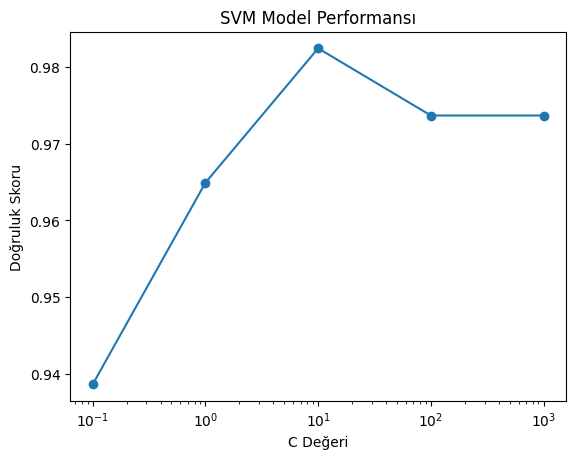

In [70]:
# Farklı C değerleri için SVM modellerini değerlendir
C_values = [0.1, 1, 10, 100, 1000]
svm_accuracies = []

for C in C_values:
    # SVC kullanarak SVM modelini eğit
    svm_model = SVC(C=C)
    svm_model.fit(X_train, y_train)
    
    # SVM modeli ile tahmin yap
    svm_pred = svm_model.predict(X_test)
    svm_accuracy = accuracy_score(y_test, svm_pred)
    svm_accuracies.append(svm_accuracy)

# Grafiği oluştur
plt.plot(C_values, svm_accuracies, marker='o')
plt.title('SVM Model Performansı')
plt.xlabel('C Değeri')
plt.ylabel('Doğruluk Skoru')
plt.xscale('log')  # C değerleri logaritmik ölçekte
plt.show()

In [71]:
#print classification report
creport = classification_report(y_test, svm_pred)
print("Classification report:\n",creport)

Classification report:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98        66
           1       1.00      0.94      0.97        48

    accuracy                           0.97       114
   macro avg       0.98      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



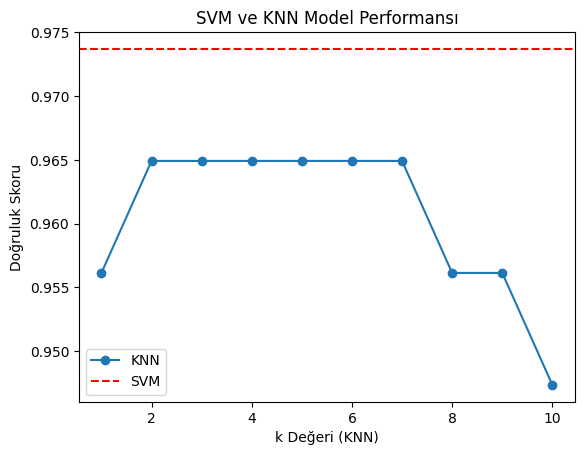

In [72]:
#SVM VS KNN grafik
plt.plot(k_values, accuracies, label='KNN', marker='o')
plt.axhline(y=svm_accuracy, color='r', linestyle='--', label='SVM')
plt.title('SVM ve KNN Model Performansı')
plt.xlabel('k Değeri (KNN)')
plt.ylabel('Doğruluk Skoru')
plt.legend()
plt.show()

- Knn sınıflandırmada %96.5 civarında bir doğruluğa ulaşmıştık.
- SVM modelinin Wisconsin meme kanseri veri kümesi için (en azından bu projede  ele alınan modellerin dışında) ortalama 0,97 doğruluk, 0,97 Kötü Huylu hassasiyet  ile optimal sınıflandırma modeli olduğu sonucuna vardık.